<a href="https://colab.research.google.com/github/plaban1981/Fastai/blob/master/Boat_Dataset_Classification_using_pytorch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://gitlab.com/clorichel/machine-learning-and-object-detection

Cloning into 'machine-learning-and-object-detection'...
remote: Enumerating objects: 22, done.
remote: Counting objects: 100% (22/22), done.
remote: Compressing objects: 100% (18/18), done.
remote: Total 22 (delta 3), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (22/22), done.


# Use Kaggle to download dataset

In [ ]:
!pip install -q kaggle
from google.colab import files
files.upload() #kaggle.json file downloaded from api
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

!kaggle datasets list

Saving kaggle.json to kaggle.json
ref                                                               title                                                 size  lastUpdated          downloadCount  
----------------------------------------------------------------  --------------------------------------------------  ------  -------------------  -------------  
nehaprabhavalkar/indian-food-101                                  Indian Food 101                                        7KB  2020-09-30 06:23:43           4122  
christianlillelund/donald-trumps-rallies                          Donald Trump's Rallies                               720KB  2020-09-26 10:25:08           1024  
heeraldedhia/groceries-dataset                                    Groceries dataset                                    257KB  2020-09-17 04:36:08           4761  
andrewmvd/trip-advisor-hotel-reviews                              Trip Advisor Hotel Reviews                             5MB  2020-09-30 08:31:20      

In [ ]:
!kaggle datasets download -d clorichel/boat-types-recognition

100% 840M/842M [00:09<00:00, 97.1MB/s]
100% 842M/842M [00:09<00:00, 89.8MB/s]


## Unzip data and move to Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip "/content/boat-types-recognition.zip" -d "/content/drive/My Drive/Adrain"

Archive:  /content/boat-types-recognition.zip
  inflating: /content/drive/My Drive/Adrain/boats/buoy/alaska-ocean-warning-light-sea-2574393.jpg  
  inflating: /content/drive/My Drive/Adrain/boats/buoy/anchor-warp-rope-buoy-beach-2881563.jpg  
  inflating: /content/drive/My Drive/Adrain/boats/buoy/beach-buoy-w-water-sea-ocean-1042883.jpg  
  inflating: /content/drive/My Drive/Adrain/boats/buoy/beacon-lighthouse-coast-navigation-39232.jpg  
  inflating: /content/drive/My Drive/Adrain/boats/buoy/blue-boat-buoy-floating-2834157.jpg  
  inflating: /content/drive/My Drive/Adrain/boats/buoy/blue-buoy-float-navigation-ocean-20511.jpg  
  inflating: /content/drive/My Drive/Adrain/boats/buoy/boat-water-bird-beach-sand-2840152.jpg  
  inflating: /content/drive/My Drive/Adrain/boats/buoy/bojka-buoy-water-bojka-rescue-882679.jpg  
  inflating: /content/drive/My Drive/Adrain/boats/buoy/buoy-beach-sea-buoys-scenic-242727.jpg  
  inflating: /content/drive/My Drive/Adrain/boats/buoy/buoy-beacon-sea-bea

In [ ]:
import os
import pandas as pd
import numpy as np
from PIL import Image
from glob import glob
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [ ]:
Image_path = "/content/drive/My Drive/Adrain/boats/"
categories = glob(Image_path + "*")

In [ ]:
categories

['/content/drive/My Drive/Adrain/boats/buoy',
 '/content/drive/My Drive/Adrain/boats/cruise ship',
 '/content/drive/My Drive/Adrain/boats/ferry boat',
 '/content/drive/My Drive/Adrain/boats/freight boat',
 '/content/drive/My Drive/Adrain/boats/gondola',
 '/content/drive/My Drive/Adrain/boats/inflatable boat',
 '/content/drive/My Drive/Adrain/boats/kayak',
 '/content/drive/My Drive/Adrain/boats/paper boat',
 '/content/drive/My Drive/Adrain/boats/sailboat']

In [ ]:
filedf = pd.DataFrame()
for cat in categories:
  files = glob(cat + "/*")
  filepath = files
  Category = cat.split("/")[-1]
  tempdf = pd.DataFrame({'Filepath':filepath,'Category':Category})
  filedf = pd.concat([filedf,tempdf])

In [ ]:
filedf.head()

,Filepath,Category
0,/content/drive/My Drive/Adrain/boats/buoy/alas...,buoy
1,/content/drive/My Drive/Adrain/boats/buoy/anch...,buoy
2,/content/drive/My Drive/Adrain/boats/buoy/blue...,buoy
3,/content/drive/My Drive/Adrain/boats/buoy/beac...,buoy
4,/content/drive/My Drive/Adrain/boats/buoy/blue...,buoy


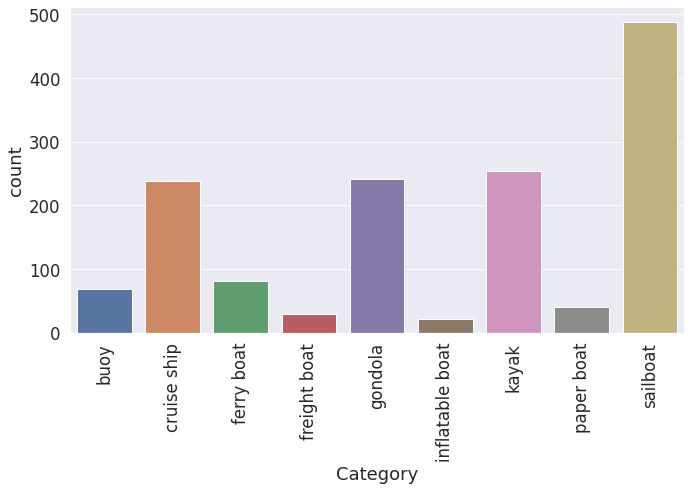

In [ ]:
sns.set(style='darkgrid',font_scale=1.5)
plt.figure(figsize=(11,6))
plt.xticks(rotation=90)
sns.countplot(filedf['Category'])

# Build Montages

**Display images along with their respective labels**

In [ ]:
from imutils import build_montages
from imutils import paths
import random
import cv2

In [ ]:
i = random.randint(10,100)
filedf.iloc[i].values.tolist()

['/content/drive/My Drive/Adrain/boats/buoy/colorful-blue-buoy-monument-beach-242730.jpg',
 'buoy']

In [ ]:
images = []
labels = []
# convert the dataframe into an array
files = filedf.values
#loop through 25 times and each loop randomly pick up an image and build the montage
for i in range(26):
  j = random.randint(10,100)
  #print(files[j])
  img = files[j][0]
  l = files[j][1]
  image = cv2.imread(img)
  cv2.putText(image,l,(120,100),cv2.FONT_HERSHEY_COMPLEX,3.5,(255,0,0),8)
  images.append(image)
  labels.append(l)


# Visualize the labels

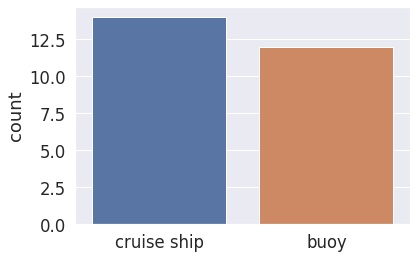

In [ ]:
sns.countplot(labels)


In [ ]:
# construct the montages for the images
montages = build_montages(images, (224,224), (5,3))

# Visualize the montage of images built using opencv

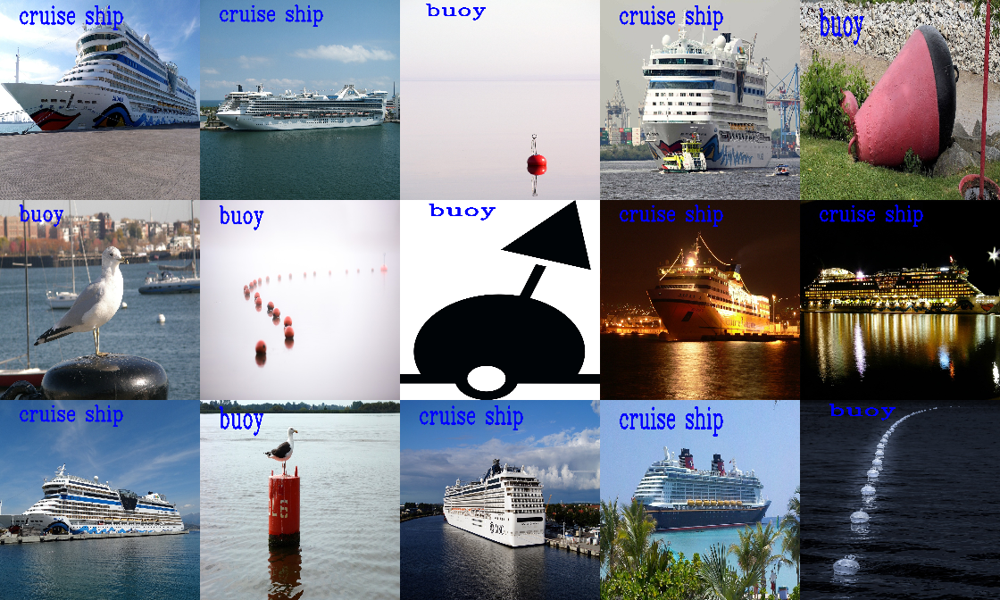

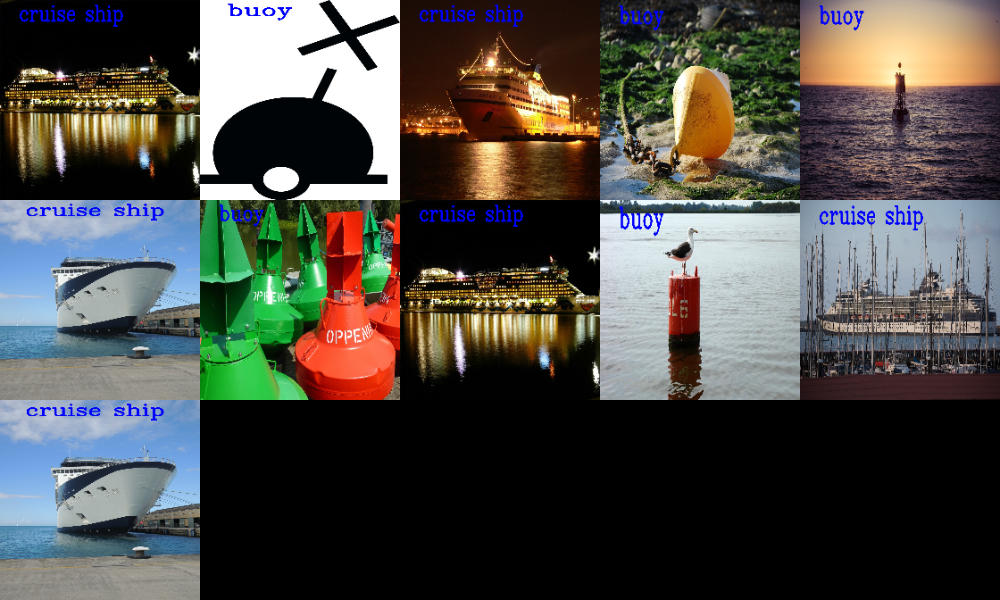

In [ ]:
from google.colab.patches import cv2_imshow
# loop over the montages and display each of them
for montage in montages:
	cv2_imshow(montage)
	#cv2.waitKey(0)

# Use matplotlib to view corresponding images

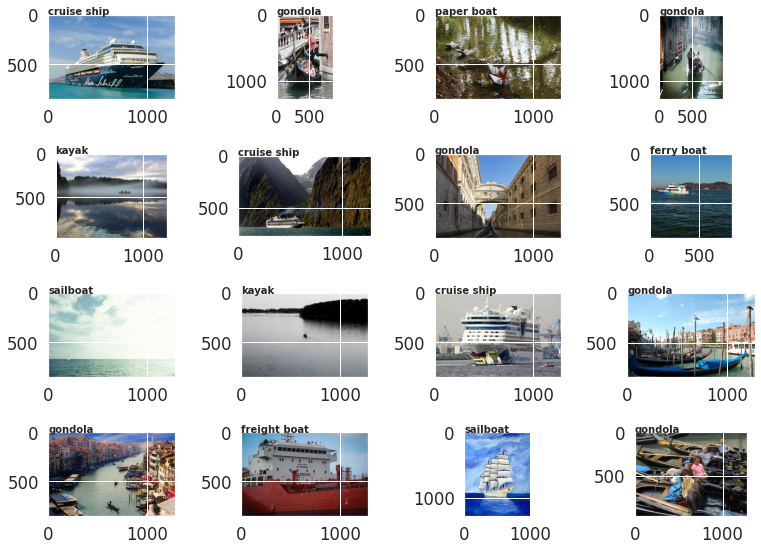

In [ ]:
plt.figure(figsize=(11,8))
for i in range(16):
  path = filedf.sample(1)['Filepath'].values[0]
  category = path.split("/")[-2]
  ex_img = Image.open(path)
  ax = plt.subplot(4,4,i +1)
  ax.annotate(category,xy=(0.65,0.9),size=10,weight="bold")
  ax.imshow(ex_img)

plt.tight_layout()

In [ ]:
filedf.groupby('Category').agg('count').rename(columns={'Filepath':'Count'}).reset_index().sort_values(by='Count',ascending=False)

,Category,Count
8,sailboat,488
6,kayak,254
4,gondola,242
1,cruise ship,239
2,ferry boat,81
0,buoy,68
7,paper boat,40
3,freight boat,29
5,inflatable boat,21


# Train Test Split

In [ ]:
from sklearn.model_selection import  train_test_split
X_train,X_test,_,_ = train_test_split(filedf,filedf['Category'],
                                      stratify=filedf['Category'],
                                      test_size=0.2,
                                      random_state=42)

In [ ]:
X_test,X_val,_,_ = train_test_split(X_test,X_test['Category'],
                                      stratify=X_test['Category'],
                                      test_size=0.2,
                                      random_state=42)

In [ ]:
X_train.shape,X_test.shape,X_val.shape

((1169, 2), (234, 2), (59, 2))

# Create new folders for train,test,validation

In [ ]:
!mkdir "/content/drive/My Drive/Adrain/Data"
!mkdir "/content/drive/My Drive/Adrain/Data/Train"
!mkdir "/content/drive/My Drive/Adrain/Data/Test"
!mkdir "/content/drive/My Drive/Adrain/Data/Valid"

# Visualize the Train labels

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 <a list of 9 Text major ticklabel objects>)

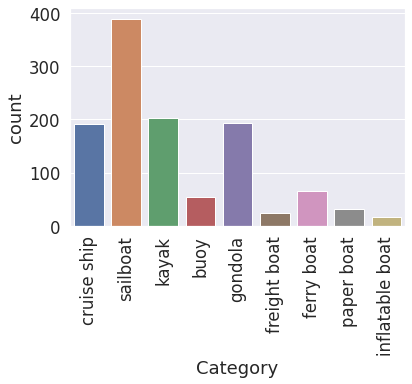

In [ ]:
sns.countplot(X_train['Category'])
plt.xticks(rotation=90)

# Visuakize Test Labels

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 <a list of 9 Text major ticklabel objects>)

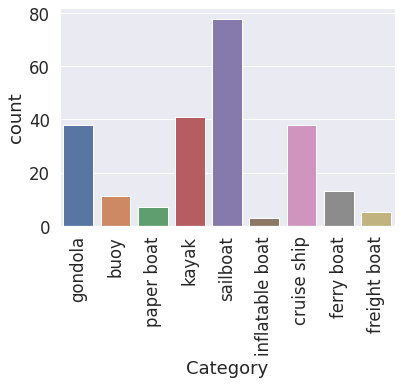

In [ ]:
sns.countplot(X_test['Category'])
plt.xticks(rotation=90)

# Visualize the Validation Labels

(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 <a list of 9 Text major ticklabel objects>)

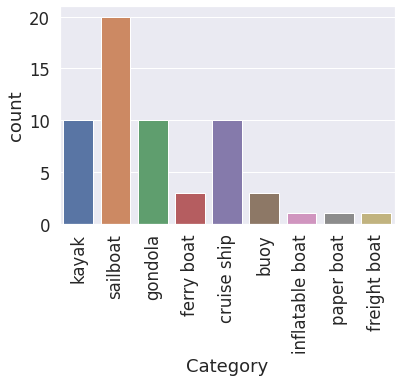

In [ ]:
sns.countplot(X_val['Category'])
plt.xticks(rotation=90)

# Create Category subfolders

In [ ]:
for cat in filedf['Category'].unique():
  path = "/content/drive/My Drive/Adrain/Data/Train/"+cat
  os.mkdir(path)

In [ ]:
for cat in filedf['Category'].unique():
  path = "/content/drive/My Drive/Adrain/Data/Test/"+cat
  os.mkdir(path)

In [ ]:
for cat in filedf['Category'].unique():
  path = "/content/drive/My Drive/Adrain/Data/Valid/"+cat
  os.mkdir(path)

FileExistsError: ignored

# Copy Train images to train folder

In [ ]:
import shutil

In [ ]:
for item in X_train.values:
  dest = "/content/drive/My Drive/Adrain/Data/Train/"+item[1]
  print(dest)
  if os.path.exists(dest):
    continue
  else:
    shutil.move(item[0],dest)

/content/drive/My Drive/Adrain/Data/Train/cruise ship
/content/drive/My Drive/Adrain/Data/Train/cruise ship
/content/drive/My Drive/Adrain/Data/Train/sailboat
/content/drive/My Drive/Adrain/Data/Train/cruise ship
/content/drive/My Drive/Adrain/Data/Train/sailboat
/content/drive/My Drive/Adrain/Data/Train/sailboat
/content/drive/My Drive/Adrain/Data/Train/kayak
/content/drive/My Drive/Adrain/Data/Train/sailboat
/content/drive/My Drive/Adrain/Data/Train/kayak
/content/drive/My Drive/Adrain/Data/Train/cruise ship
/content/drive/My Drive/Adrain/Data/Train/buoy
/content/drive/My Drive/Adrain/Data/Train/sailboat
/content/drive/My Drive/Adrain/Data/Train/gondola
/content/drive/My Drive/Adrain/Data/Train/sailboat
/content/drive/My Drive/Adrain/Data/Train/gondola
/content/drive/My Drive/Adrain/Data/Train/kayak
/content/drive/My Drive/Adrain/Data/Train/gondola
/content/drive/My Drive/Adrain/Data/Train/kayak
/content/drive/My Drive/Adrain/Data/Train/kayak
/content/drive/My Drive/Adrain/Data/Train

In [ ]:
for item in X_test.values:
  dest = "/content/drive/My Drive/Adrain/Data/Test/"+item[1]
  print(dest)
  shutil.move(item[0],dest)

/content/drive/My Drive/Adrain/Data/Test/gondola
/content/drive/My Drive/Adrain/Data/Test/gondola
/content/drive/My Drive/Adrain/Data/Test/buoy
/content/drive/My Drive/Adrain/Data/Test/paper boat
/content/drive/My Drive/Adrain/Data/Test/gondola
/content/drive/My Drive/Adrain/Data/Test/kayak
/content/drive/My Drive/Adrain/Data/Test/sailboat
/content/drive/My Drive/Adrain/Data/Test/gondola
/content/drive/My Drive/Adrain/Data/Test/inflatable boat
/content/drive/My Drive/Adrain/Data/Test/kayak
/content/drive/My Drive/Adrain/Data/Test/paper boat
/content/drive/My Drive/Adrain/Data/Test/sailboat
/content/drive/My Drive/Adrain/Data/Test/sailboat
/content/drive/My Drive/Adrain/Data/Test/gondola
/content/drive/My Drive/Adrain/Data/Test/buoy
/content/drive/My Drive/Adrain/Data/Test/cruise ship
/content/drive/My Drive/Adrain/Data/Test/gondola
/content/drive/My Drive/Adrain/Data/Test/cruise ship
/content/drive/My Drive/Adrain/Data/Test/sailboat
/content/drive/My Drive/Adrain/Data/Test/sailboat
/co

In [ ]:
for item in X_val.values:
  dest = "/content/drive/My Drive/Adrain/Data/Valid/"+item[1]
  print(dest)
  shutil.move(item[0],dest)

/content/drive/My Drive/Adrain/Data/Valid/kayak
/content/drive/My Drive/Adrain/Data/Valid/sailboat
/content/drive/My Drive/Adrain/Data/Valid/sailboat
/content/drive/My Drive/Adrain/Data/Valid/gondola
/content/drive/My Drive/Adrain/Data/Valid/sailboat
/content/drive/My Drive/Adrain/Data/Valid/gondola
/content/drive/My Drive/Adrain/Data/Valid/ferry boat
/content/drive/My Drive/Adrain/Data/Valid/cruise ship
/content/drive/My Drive/Adrain/Data/Valid/kayak
/content/drive/My Drive/Adrain/Data/Valid/sailboat
/content/drive/My Drive/Adrain/Data/Valid/gondola
/content/drive/My Drive/Adrain/Data/Valid/ferry boat
/content/drive/My Drive/Adrain/Data/Valid/sailboat
/content/drive/My Drive/Adrain/Data/Valid/gondola
/content/drive/My Drive/Adrain/Data/Valid/buoy
/content/drive/My Drive/Adrain/Data/Valid/sailboat
/content/drive/My Drive/Adrain/Data/Valid/inflatable boat
/content/drive/My Drive/Adrain/Data/Valid/kayak
/content/drive/My Drive/Adrain/Data/Valid/sailboat
/content/drive/My Drive/Adrain/Dat

# Fastai

In [ ]:
%matplotlib inline
from fastai import *
from fastai.vision import *

In [ ]:
path = "/content/drive/My Drive/Adrain/Data"
dfms = get_transforms(flip_vert=True,do_flip=True,max_zoom=1.05,max_lighting=0.1)
data = ImageDataBunch.from_folder(path,train='Train',valid='Valid',test='Test',ds_tfms= dfms,size=224,bs=32).normalize(imagenet_stats)

In [ ]:
data

ImageDataBunch;

Train: LabelList (1120 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
buoy,buoy,buoy,buoy,buoy
Path: /content/drive/My Drive/Adrain/Data;

Valid: LabelList (367 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
buoy,buoy,buoy,buoy,buoy
Path: /content/drive/My Drive/Adrain/Data;

Test: LabelList (234 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: EmptyLabelList
,,,,
Path: /content/drive/My Drive/Adrain/Data

In [ ]:
data.classes

['buoy',
 'cruise ship',
 'ferry boat',
 'freight boat',
 'gondola',
 'inflatable boat',
 'kayak',
 'paper boat',
 'sailboat']

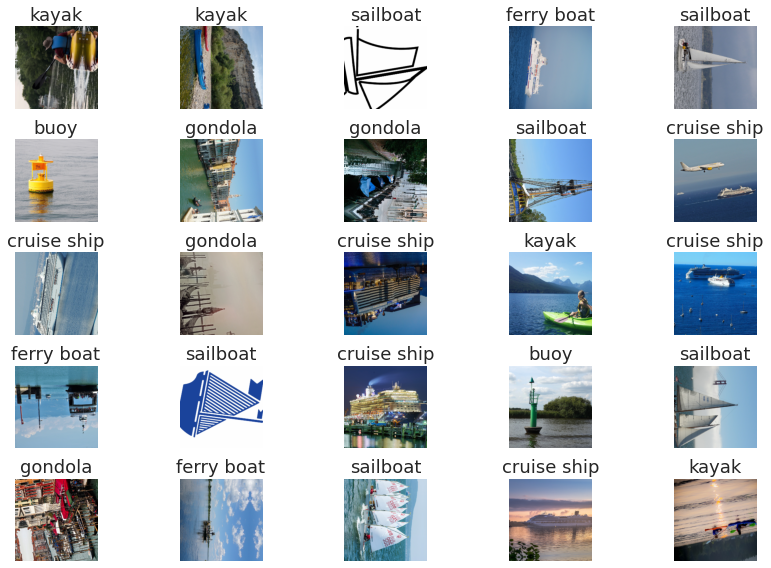

In [ ]:
data.show_batch(rows=5,figsize=(12,8))

# Train the Model

In [ ]:
learn = create_cnn(data,models.resnet34,metrics=error_rate)

In [ ]:
learn.fit_one_cycle(10)

epoch,train_loss,valid_loss,error_rate,time
0,2.667839,0.886545,0.280654,01:12
1,1.723233,0.501208,0.160763,01:11
2,1.330791,0.598551,0.177112,01:12
3,1.146481,0.407192,0.152589,01:12
4,0.952739,0.417585,0.133515,01:12
5,0.793409,0.386955,0.119891,01:12
6,0.703860,0.345492,0.117166,01:12
7,0.624312,0.310523,0.103542,01:12
8,0.575686,0.290007,0.098093,01:12
9,0.539254,0.281856,0.092643,01:12


In [ ]:
preds,y = learn.get_preds(DatasetType.Valid)

Validation Accuracy

In [ ]:
accuracy(preds,y)

tensor(0.9074)

In [ ]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


# Find Optimum Learning Rate

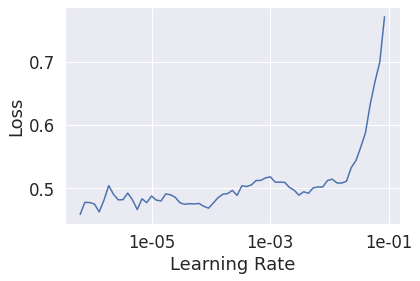

In [ ]:
learn.recorder.plot()

In [ ]:
learn.fit_one_cycle(10,max_lr=1e-4)

epoch,train_loss,valid_loss,error_rate,time
0,0.546098,0.298684,0.108992,01:12
1,0.524951,0.290818,0.103542,01:12
2,0.490595,0.275756,0.098093,01:12
3,0.489577,0.266170,0.092643,01:12
4,0.500360,0.265226,0.092643,01:12
5,0.494665,0.273845,0.098093,01:12
6,0.463908,0.255773,0.087193,01:12
7,0.492913,0.261805,0.095368,01:12
8,0.479374,0.264238,0.095368,01:12
9,0.445499,0.272082,0.103542,01:12


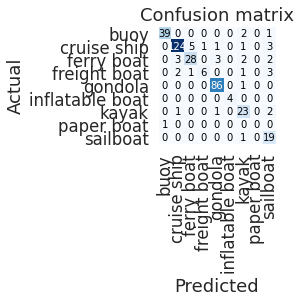

In [211]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

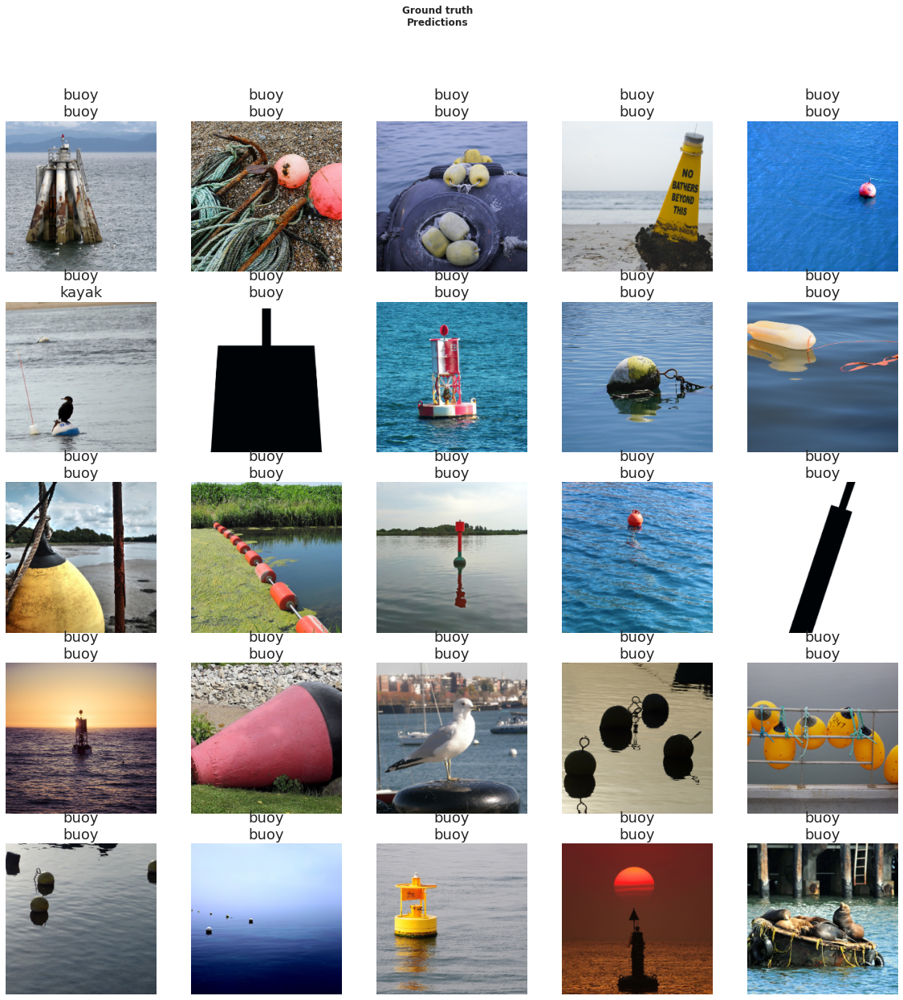

In [212]:
learn.show_results()

In [213]:
preds,y = learn.get_preds(DatasetType.Valid)

In [214]:
accuracy(preds,y)

tensor(0.8965)

## Save the model

In [215]:
learn.save('model_resnet_34')

# Unfreeze Model

In [216]:
learn.unfreeze()
learn.fit_one_cycle(10)

epoch,train_loss,valid_loss,error_rate,time
0,0.498019,0.239766,0.070845,01:12
1,0.546678,0.626338,0.182561,01:12
2,0.803099,1.070192,0.261580,01:11
3,0.800917,0.700890,0.209809,01:10
4,0.732132,0.608406,0.177112,01:09
5,0.601951,0.487523,0.128065,01:08
6,0.468139,0.313991,0.111717,01:07
7,0.381130,0.315255,0.089918,01:07
8,0.301732,0.279534,0.079019,01:07
9,0.242664,0.260814,0.068120,01:07


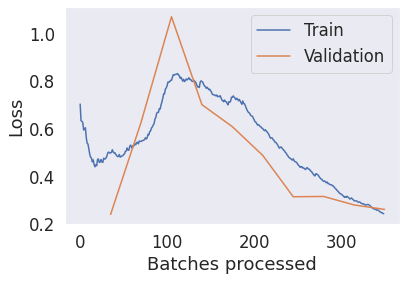

In [217]:
learn.recorder.plot_losses()

In [218]:
learn.recorder.plot_metrics

<bound method Recorder.plot_metrics of Recorder
learn: Learner(data=ImageDataBunch;

Train: LabelList (1120 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
buoy,buoy,buoy,buoy,buoy
Path: /content/drive/My Drive/Adrain/Data;

Valid: LabelList (367 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: CategoryList
buoy,buoy,buoy,buoy,buoy
Path: /content/drive/My Drive/Adrain/Data;

Test: LabelList (234 items)
x: ImageList
Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224),Image (3, 224, 224)
y: EmptyLabelList
,,,,
Path: /content/drive/My Drive/Adrain/Data, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxP

In [219]:
preds,y = learn.get_preds(DatasetType.Valid)

In [220]:
accuracy(preds,y )

tensor(0.9319)

In [222]:
learn.save('model_resnet_34_unfreeze_1')

Traceback (most recent call last):
  File "/usr/lib/python3.6/multiprocessing/queues.py", line 230, in _feed
    close()
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 177, in close
    self._close()
  File "/usr/lib/python3.6/multiprocessing/connection.py", line 361, in _close
    _close(self._handle)
OSError: [Errno 9] Bad file descriptor


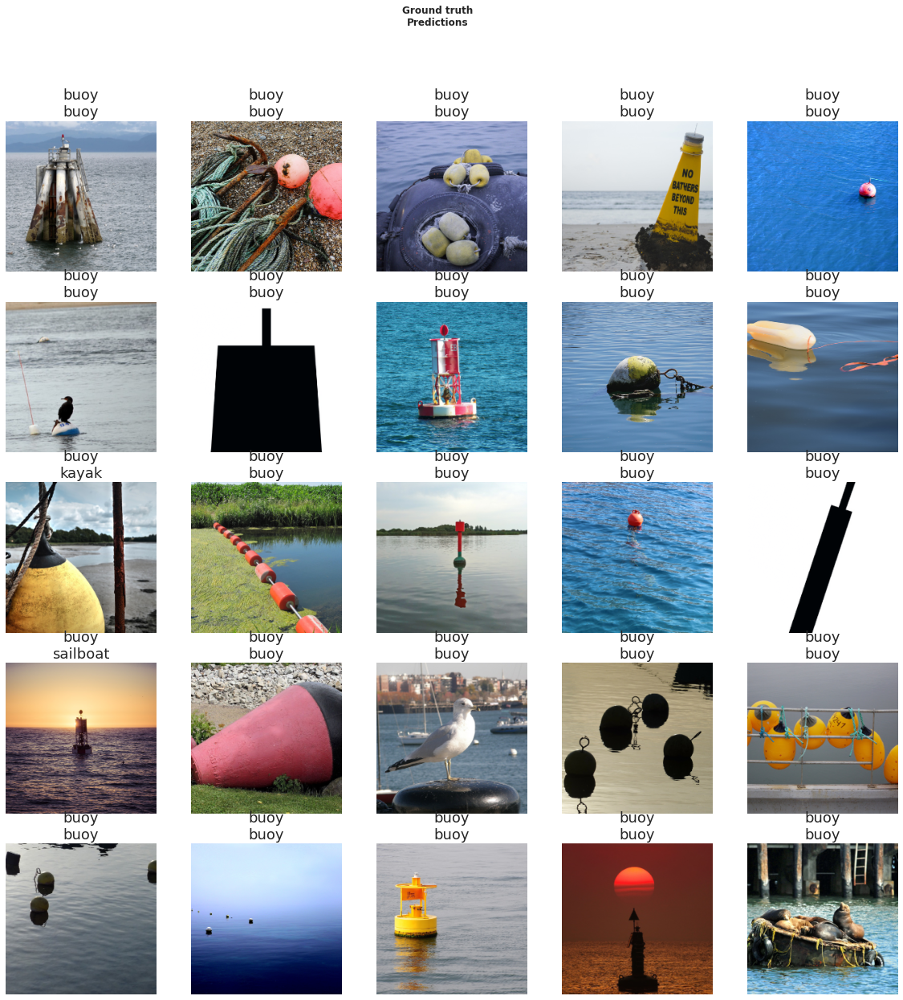

In [223]:
learn.show_results()

epoch,train_loss,valid_loss,error_rate,time


LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


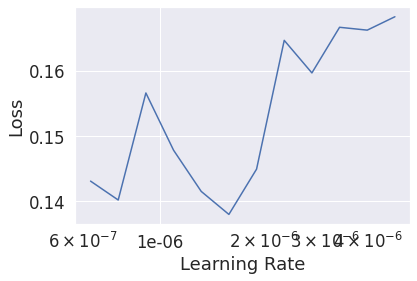

In [225]:
learn.lr_find()
learn.recorder.plot()

In [227]:
learn.fit_one_cycle(10,max_lr=slice(1e-6,1e-4))

epoch,train_loss,valid_loss,error_rate,time
0,0.186816,0.267626,0.070845,01:07
1,0.168069,0.251405,0.065395,01:08
2,0.186873,0.236162,0.054496,01:09
3,0.163393,0.236526,0.059946,01:09
4,0.171678,0.220628,0.046322,01:09
5,0.164705,0.212838,0.043597,01:09
6,0.154152,0.203599,0.046322,01:09
7,0.148279,0.208896,0.040872,01:10
8,0.143134,0.200506,0.043597,01:10
9,0.154331,0.206836,0.038147,01:10


In [228]:
preds,y = learn.get_preds(DatasetType.Valid)
accuracy(preds,y)

tensor(0.9619)

In [232]:
interp = ClassificationInterpretation.from_learner(learn)

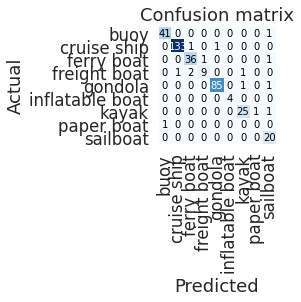

In [233]:
interp.plot_confusion_matrix()

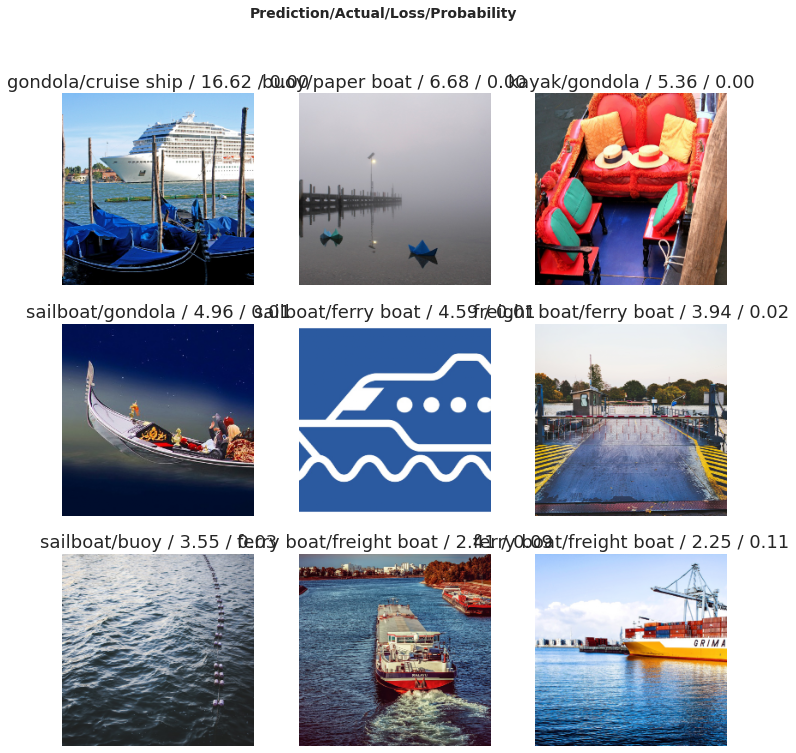

In [234]:
interp.plot_top_losses(9)

In [235]:
learn.save('model_resnet_34_unfreeze_96')

In [236]:
predictions,y = learn.get_preds(DatasetType.Test)

In [238]:
predictions

tensor([[9.6624e-01, 9.4574e-10, 3.1291e-07,  ..., 3.3587e-02, 1.4384e-07,
         7.9056e-08],
        [9.9838e-01, 2.0367e-08, 2.6325e-07,  ..., 1.2645e-03, 7.5351e-08,
         8.5259e-06],
        [8.9205e-01, 5.9913e-07, 4.9072e-04,  ..., 8.8953e-02, 2.5832e-03,
         1.6792e-03],
        ...,
        [2.2571e-02, 2.8341e-03, 2.0948e-03,  ..., 7.2226e-03, 9.4240e-04,
         9.5023e-01],
        [2.3429e-04, 9.5159e-04, 1.0140e-03,  ..., 1.0987e-05, 3.4305e-05,
         9.9737e-01],
        [3.4799e-04, 7.5044e-03, 3.0735e-03,  ..., 5.9781e-04, 4.1683e-02,
         9.4449e-01]])

In [239]:
result = []
for pred in predictions:
  result.append(data.classes[pred.argmax()])

In [240]:
result

['buoy',
 'buoy',
 'buoy',
 'buoy',
 'buoy',
 'kayak',
 'gondola',
 'buoy',
 'buoy',
 'sailboat',
 'kayak',
 'cruise ship',
 'sailboat',
 'cruise ship',
 'cruise ship',
 'cruise ship',
 'cruise ship',
 'cruise ship',
 'cruise ship',
 'cruise ship',
 'cruise ship',
 'cruise ship',
 'cruise ship',
 'cruise ship',
 'cruise ship',
 'cruise ship',
 'cruise ship',
 'cruise ship',
 'inflatable boat',
 'cruise ship',
 'kayak',
 'cruise ship',
 'cruise ship',
 'cruise ship',
 'cruise ship',
 'cruise ship',
 'kayak',
 'ferry boat',
 'cruise ship',
 'buoy',
 'cruise ship',
 'cruise ship',
 'cruise ship',
 'cruise ship',
 'cruise ship',
 'cruise ship',
 'cruise ship',
 'cruise ship',
 'sailboat',
 'ferry boat',
 'ferry boat',
 'ferry boat',
 'cruise ship',
 'ferry boat',
 'cruise ship',
 'cruise ship',
 'ferry boat',
 'sailboat',
 'sailboat',
 'inflatable boat',
 'ferry boat',
 'ferry boat',
 'ferry boat',
 'cruise ship',
 'sailboat',
 'kayak',
 'freight boat',
 'gondola',
 'gondola',
 'gondola',


In [242]:
X_test['Filepath'].iloc[-1]

'/content/drive/My Drive/Adrain/boats/sailboat/lake-boat-summer-idyll-water-sky-3617526.jpg'

In [243]:
X_test.shape

(234, 2)

# Visualize the results predicted Randomly

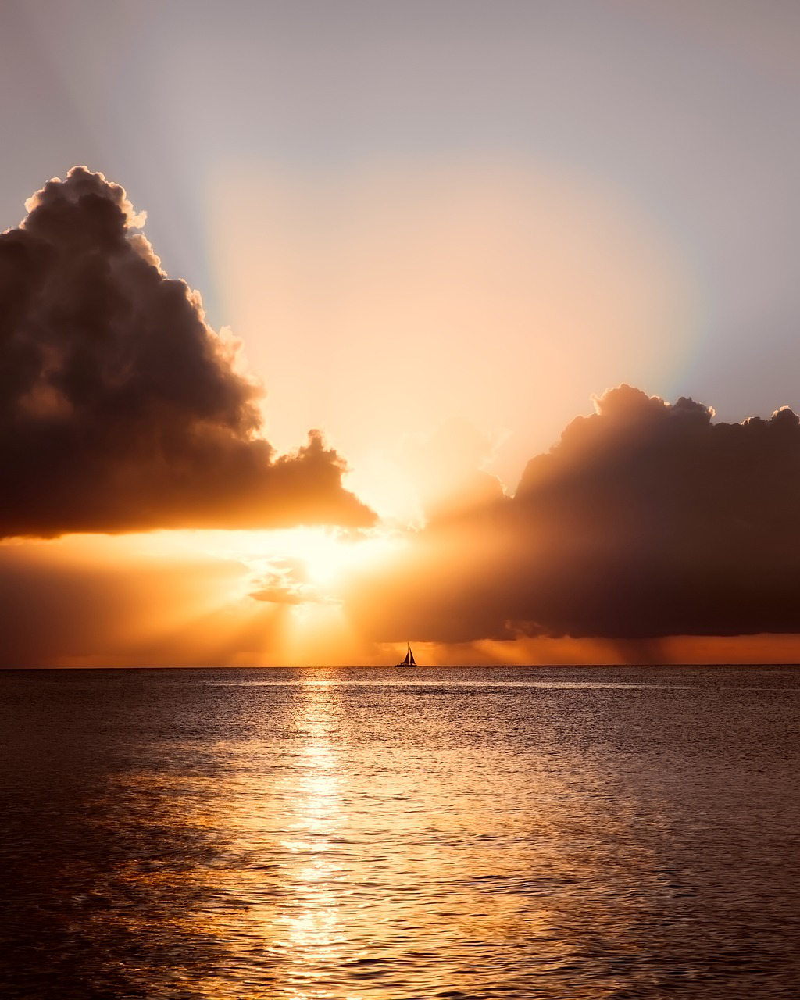

In [251]:
PIL.Image.open("/content/drive/My Drive/Adrain/Data/Test/sailboat/sailboat-sailing-sky-clouds-sea-2530235.jpg")

In [267]:
images = []
labels = []
# convert the dataframe into an array
files = X_test.values
#loop through 25 times and each loop randomly pick up an image and build the montage
for i in range(37):
  j = random.randint(0,len(X_test) -1)
  #print(files[j])
  img = files[j][0]
  img = img.replace("/content/drive/My Drive/Adrain/boats","/content/drive/My Drive/Adrain/Data/Test")
  l = files[j][1]
  #print(img)
  image = cv2.imread(img)
  #print(image.shape)
  cv2.putText(image,l,(120,100),cv2.FONT_HERSHEY_COMPLEX,3.5,(0,255,0),8)
  images.append(image)
  labels.append(l)

In [268]:
# construct the montages for the images
montages = build_montages(images, (224,224), (5,4))

# Visualize Montages built

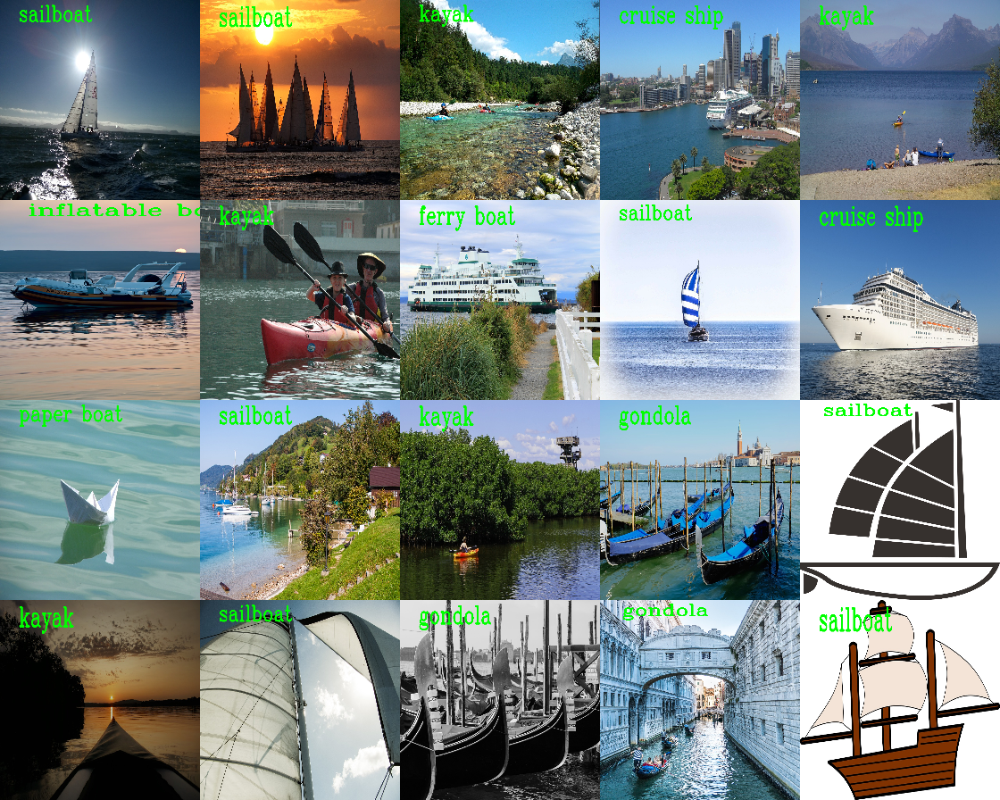

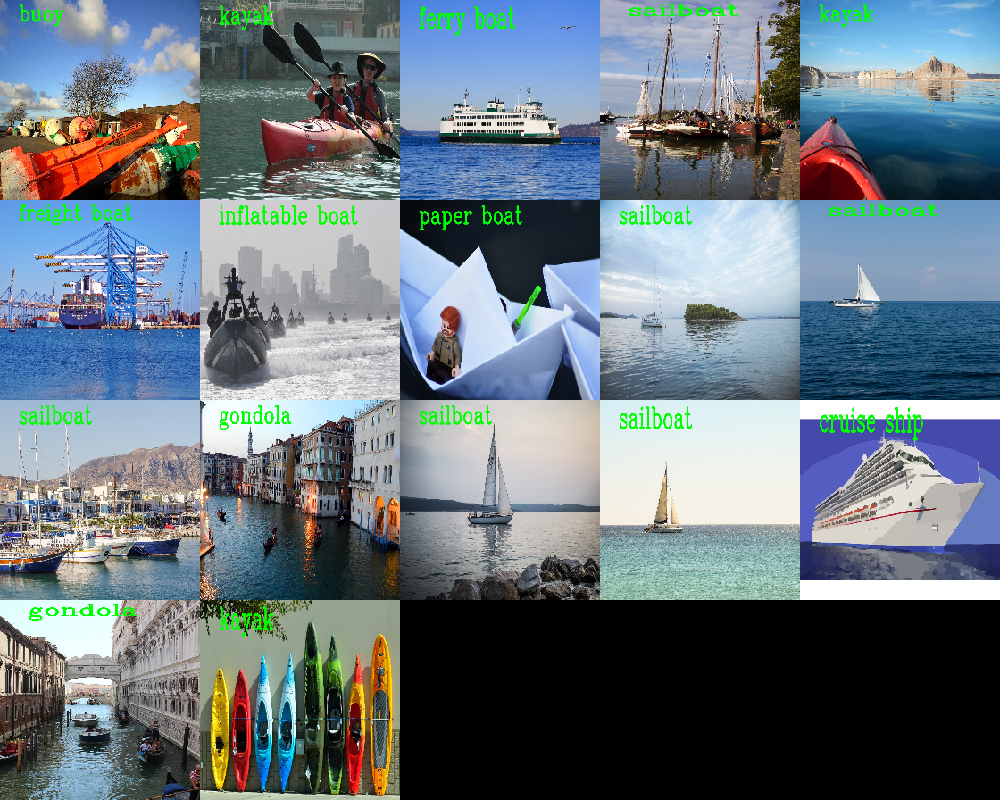

In [269]:
for montage in montages:
  cv2_imshow(montage)